# Region definition example

This example show how to use Functional_Fusion to define and extract ROI data over a group ROI in individual space - either defined on a surface or in a volume. The same functionality was implemented in the Region toolbox in Matlab. 

## Surface-based region definition



In [ ]:
import numpy as np
import nibabel as nb
import nitools as nt
import Functional_Fusion.atlas_map as am

# Data directory on the server for this example 
data_dir = ''

In [3]:
fs32L = am.get_atlas('fs32k_L')


In [5]:
A = nb.load('fs_LR.32k.L.ventralmotor.func.gii')
data = A.darrays[0].data
# Find the vertices in the ROI 
vertices = np.where(data != 0)[0]
atlas_map = am.AtlasMapSurf(vertices,'')
data = am.get_data_nifti(atlas_map,'beta_images')

array([ 8426,  8427,  9945, ..., 19747, 19752, 19753])

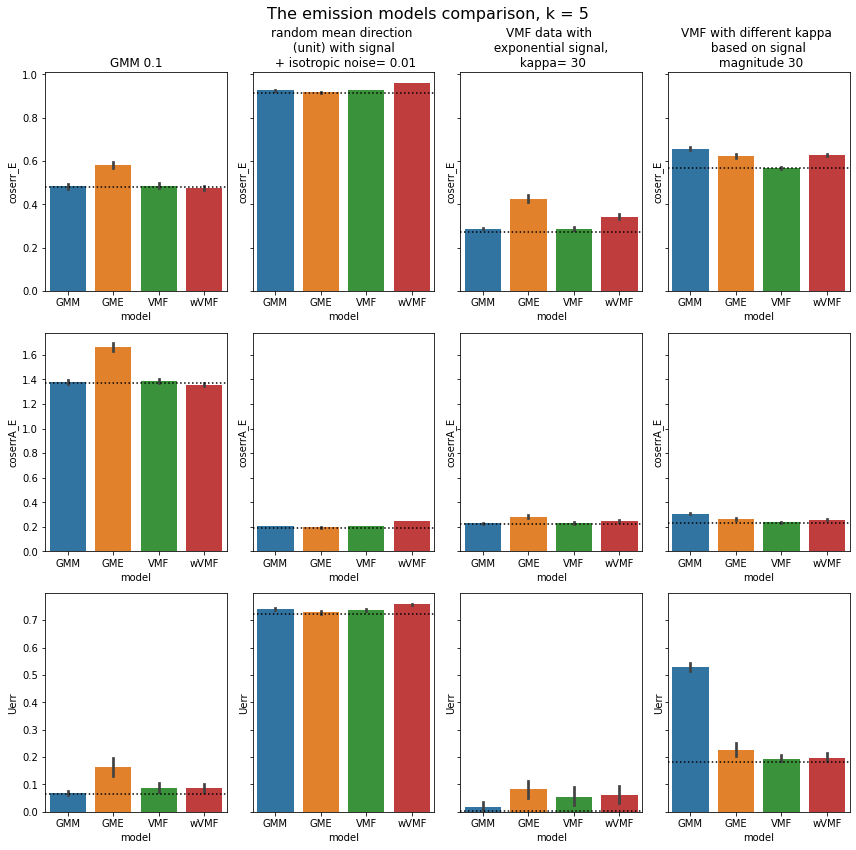

In [12]:
sys.path.append('D:\python_workspace\generativeMRF')
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_emission

K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=1000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.01, 30, 30], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.01, 30, 30])
plt.show()

In [57]:
from generativeMRF.notebooks.test_emissions import getData_from_T
import scipy.stats as spst

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(spst.ttest_rel(D2[0], D2[1]))

Ttest_relResult(statistic=1.1006561027738386, pvalue=0.2764241137274872)
Ttest_relResult(statistic=-1.0854640515635137, pvalue=0.28302770041460373)


### More data points: Simulation when kappa = 30 and 5000 data points

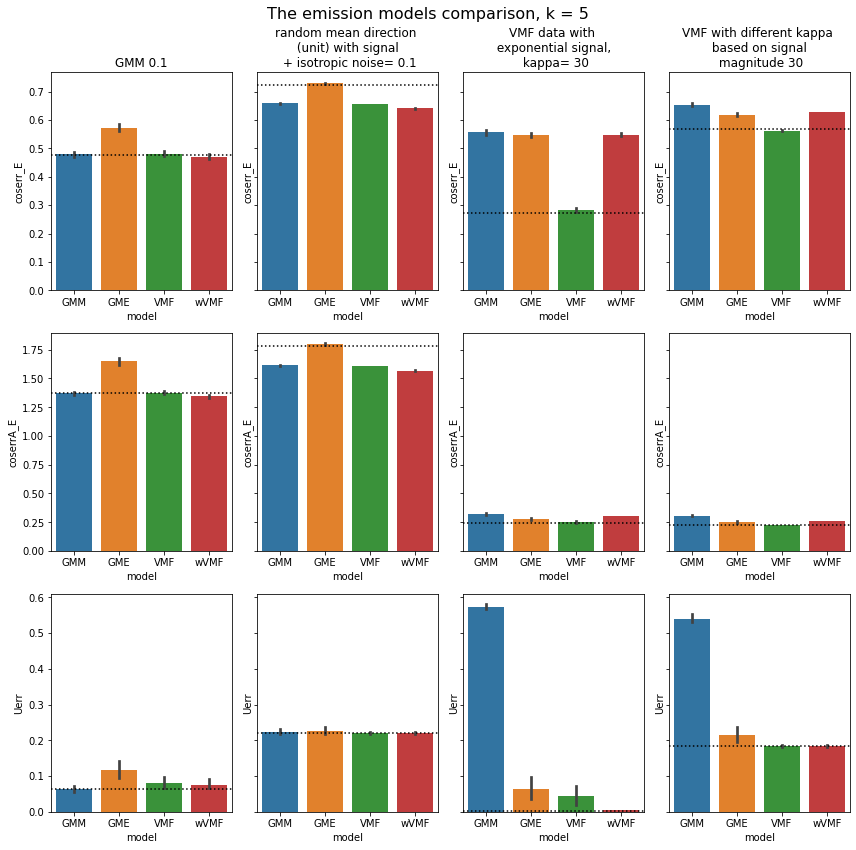

0.220316 0.22021999999999997 Ttest_relResult(statistic=0.6686702882404346, pvalue=0.5068438994342924)
0.18392399999999998 0.183496 Ttest_relResult(statistic=2.179490750321562, pvalue=0.034130778284558)


In [74]:
K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 30, 30], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 30, 30])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

In [75]:
D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'])
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'])
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.21311612903225802 0.21334838709677414 Ttest_relResult(statistic=-1.507081077909954, pvalue=0.14224885927461897)
0.17719285714285718 0.1766642857142857 Ttest_relResult(statistic=2.571677773370577, pvalue=0.01594472431128139)


### More spread: Simulation when kappa = 18 and 5000 data points

In [76]:
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
U = arrange.sample(num_subj=1)
Y1,_,_,U1,_ = generate_data('GMM', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y3,_,_,U3,_ = generate_data('VMF', k=5, dim=3, p=5000, num_sub=1, dispersion=18,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y4,_,_,U4,_ = generate_data('wVMF', k=5, dim=3, p=5000, num_sub=1, dispersion=18,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=["GME", "VMF", "wVMF"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y3[0, 0, :], y=Y3[0, 1, :], z=Y3[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U3[0])), row=1, col=2)
fig.add_trace(go.Scatter3d(x=Y4[0, 0, :], y=Y4[0, 1, :], z=Y4[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U4[0])), row=1, col=3)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

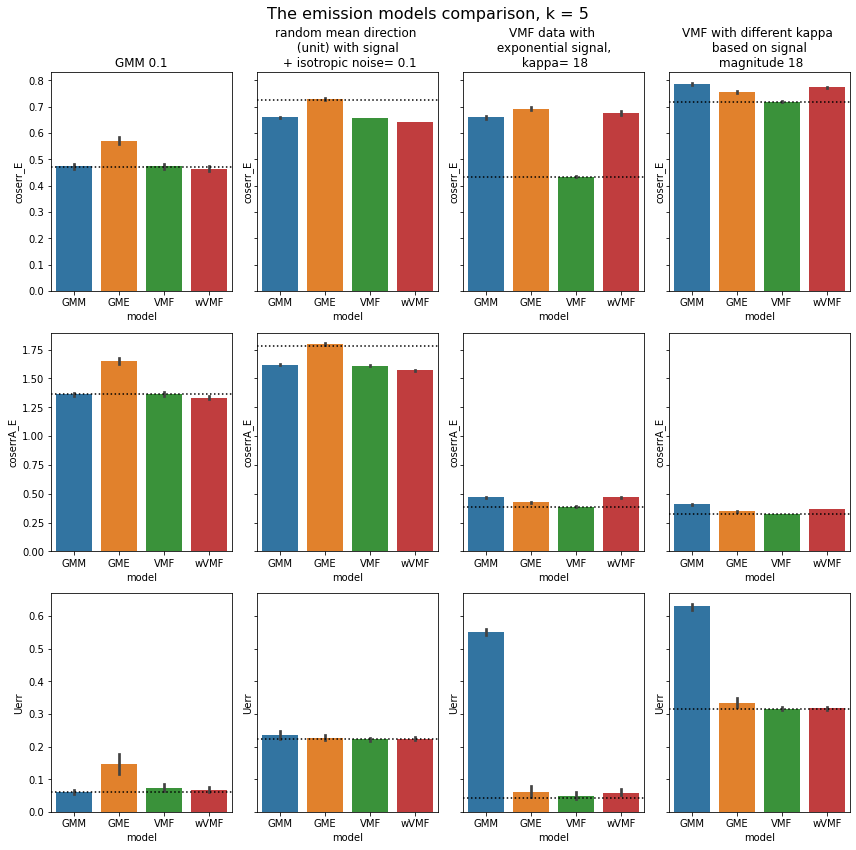

0.22332399999999997 0.22297999999999998 Ttest_relResult(statistic=2.3539342952297706, pvalue=0.022630043630008957)
0.31784 0.31610000000000005 Ttest_relResult(statistic=3.832311507654884, pvalue=0.00036215132532685325)


In [77]:
K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 18, 18], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 18, 18])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

In [71]:
D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'])
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'])
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.20941428571428572 0.20935 Ttest_relResult(statistic=0.5170997019182411, pvalue=0.6092970195921903)
0.3081769230769231 0.30753846153846154 Ttest_relResult(statistic=1.6846412033963398, pvalue=0.1045034660285164)


### More concentrated: Simulation when kappa = 50 and 5000 data points

In [55]:
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
U = arrange.sample(num_subj=1)
Y1,_,_,U1,_ = generate_data('GMM', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.1,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y3,_,_,U3,_ = generate_data('VMF', k=5, dim=3, p=5000, num_sub=1, dispersion=50,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)
Y4,_,_,U4,_ = generate_data('wVMF', k=5, dim=3, p=5000, num_sub=1, dispersion=50,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=["GME", "VMF", "wVMF"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y3[0, 0, :], y=Y3[0, 1, :], z=Y3[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U3[0])), row=1, col=2)
fig.add_trace(go.Scatter3d(x=Y4[0, 0, :], y=Y4[0, 1, :], z=Y4[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U4[0])), row=1, col=3)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

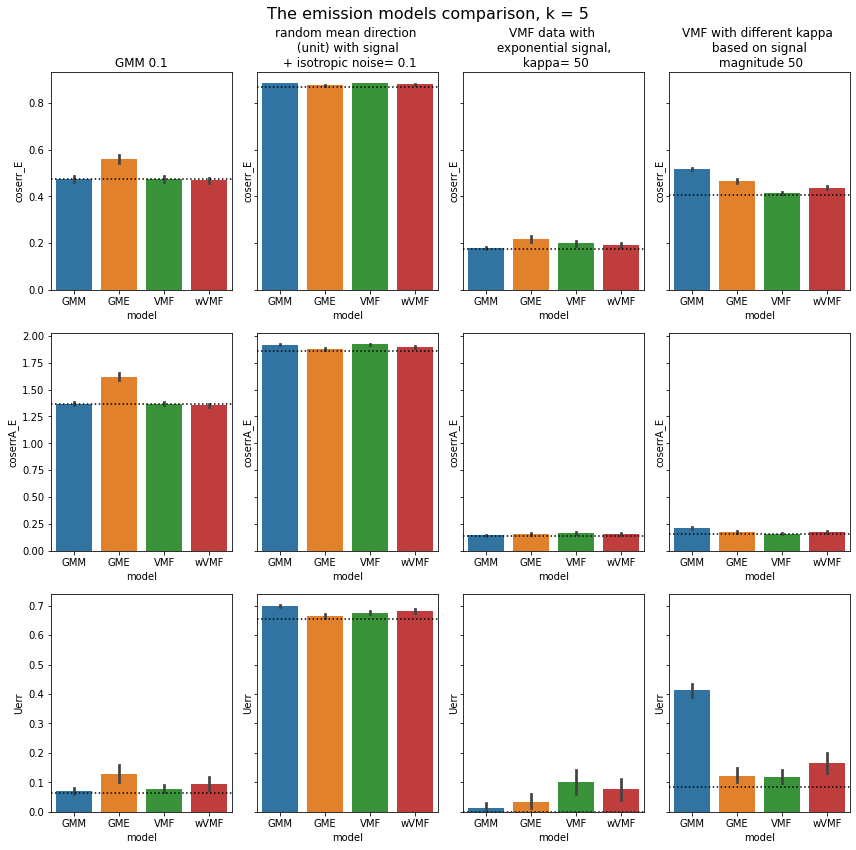

0.6820480000000001 0.676864 Ttest_relResult(statistic=1.3239537983179162, pvalue=0.19166168346508694)
0.165656 0.11691199999999999 Ttest_relResult(statistic=2.3909819511477157, pvalue=0.020689189560931458)


In [17]:
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_emission, getData_from_T

K = 5
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                true_models=['GMM', 'GME', 'VMF', 'wVMF'],
                                disper=[0.1, 0.1, 50, 50], same_signal=True, missingdata=None)
plot_comparision_emission(T, K=K, dispersion=[0.1, 0.1, 50, 50])
plt.show()

D1 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='wVMF', fit_model=['wVMF', 'VMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

## Simplified and break down the question

Please forget of above and let's focus on a simple case. By visualizing the distribution of data magnitude from the real data, we have a good intuition that the signal strength is like a skewed normal. However, we don't know what is the ground truth. So for simplicity, we just consider an extreme situation, where a large portion of the data have no magnitude at all while the rest of the data have the true magnitude, such as 80% - 0; 20% - 1.

And to further simplify the question and break it down. Let's only consider the data generating model is "GME" (actually not GME but a random mean direction with signal strength + isotropic noise). 

In [8]:
import generativeMRF.arrangements as ar
import generativeMRF.emissions as em
import generativeMRF.full_model as fm
import generativeMRF.evaluation as ev
import seaborn as sb
import torch as pt

sys.path.append('D:\python_workspace\generativeMRF')
from generativeMRF.notebooks.test_emissions import generate_data

# Step 1: Generate data by sampling from the above model
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=20, p=5000, num_sub=1, dispersion=0.01,
                  beta=1.0, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

### Visualize the signal strengths distribution

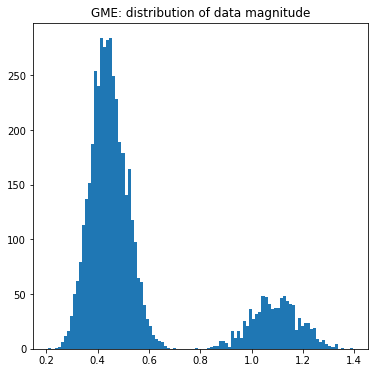

In [9]:
plt.figure(figsize=(6,6))

plt.hist(pt.norm(Y2, dim=1).reshape(-1).numpy(), bins=100)
plt.title('GME: distribution of data magnitude')

plt.show()

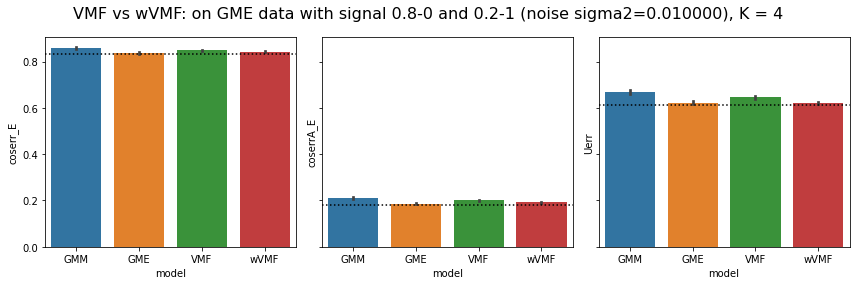

In [14]:
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_VMF_wVMF

T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.0, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

In [15]:
from generativeMRF.notebooks.test_emissions import getData_from_T
import scipy.stats as spst

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.20098099555230406 0.19297787254538393 Ttest_relResult(statistic=5.0295476366994825, pvalue=6.989931057687777e-06)
0.6458919999999999 0.621224 Ttest_relResult(statistic=6.696147601381085, pvalue=1.961557358968145e-08)


### Making signal more strength: 80% - 0s; 2% - 1.5s

In [16]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=3, p=5000, num_sub=1, dispersion=0.01,
                  beta=1.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

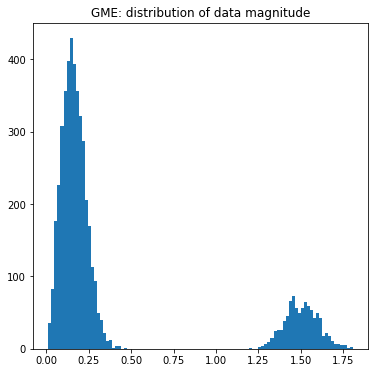

In [17]:
plt.figure(figsize=(6,6))

plt.hist(pt.norm(Y2, dim=1).reshape(-1).numpy(), bins=100)
plt.title('GME: distribution of data magnitude')

plt.show()

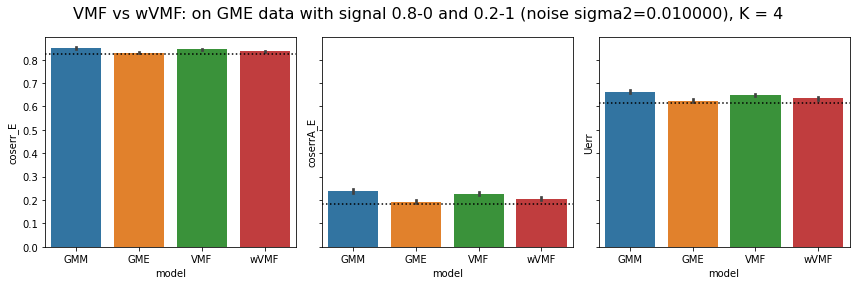

In [18]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=1.5, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

In [19]:
D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

0.226456431780565 0.20502187322445667 Ttest_relResult(statistic=5.039072785580177, pvalue=6.76485578945933e-06)
0.6482439999999999 0.6354679999999999 Ttest_relResult(statistic=3.262264271343603, pvalue=0.0020163510915066378)


### Repeat above experiment ~ 80% -0 and 20% -0.5

In [26]:
Y1,_,signal_true,U1,_ = generate_data('GME', k=5, dim=20, p=5000, num_sub=1, dispersion=0.0001,
                                      beta=0.5, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'surface'},{'type': 'surface'}]],
                    subplot_titles=["GME","GME_masked"])

Y2 = Y1 * signal_true.unsqueeze(1)
fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U1[0])), row=1, col=2)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

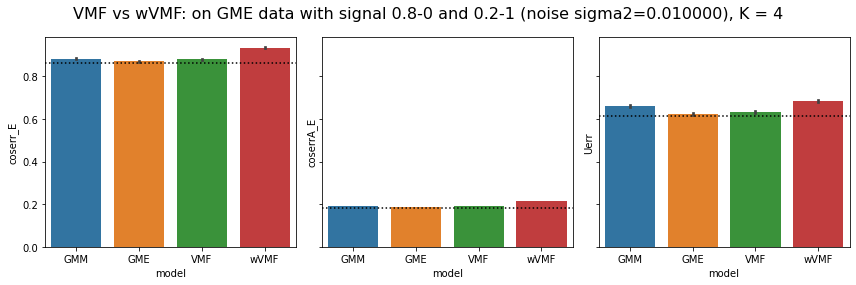

0.19088575585322648 0.21550515548313395 Ttest_relResult(statistic=-24.144805496799144, pvalue=7.313944378349413e-29)
0.6323960000000001 0.6847 Ttest_relResult(statistic=-12.625340764878215, pvalue=5.094476584342358e-17)


In [23]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=0.5, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

### Repeat above experiment ~ 80% -0 and 20% -3

In [10]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=20, p=5000, num_sub=1, dispersion=0.01,
                  beta=3.0, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

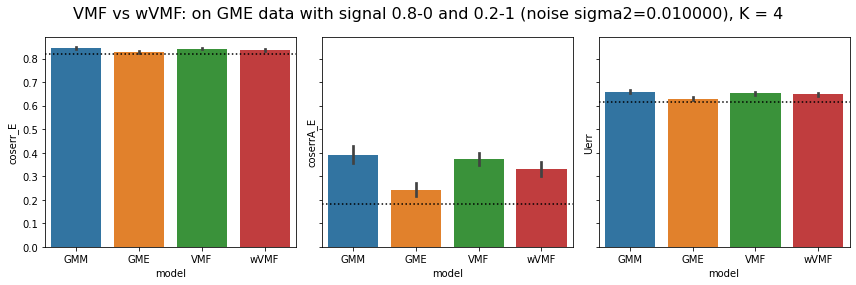

0.37356485862180233 0.3301213614133035 Ttest_relResult(statistic=2.0880006361572416, pvalue=0.042017838631442095)
0.651968 0.648112 Ttest_relResult(statistic=0.8818519149994508, pvalue=0.3821624386046044)


In [25]:
T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=3.0, subjs=1,
                                    true_models=['GME'], disper=[0.01],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.01)
plt.show()

D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))

### Repeat above experiment ~ 80% -0 and 20% -3 BUT SIGMA2 IS SMALLER

In [11]:
Y2,_,_,U2,_ = generate_data('GME', k=5, dim=20, p=5000, num_sub=1, dispersion=0.001,
                  beta=3.0, do_plot=False, same_signal=True, missingdata=None)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]],
                    subplot_titles=["GME"])

# fig.add_trace(go.Scatter3d(x=Y1[0, 0, :], y=Y1[0, 1, :], z=Y1[0, 2, :],
#                            mode='markers', marker=dict(size=3, opacity=0.7, color=U[0])), row=1, col=1)
fig.add_trace(go.Scatter3d(x=Y2[0, 0, :], y=Y2[0, 1, :], z=Y2[0, 2, :],
                           mode='markers', marker=dict(size=3, opacity=0.7, color=U2[0])), row=1, col=1)

fig.update_layout(title_text='Visualization of data generation')
fig.show()

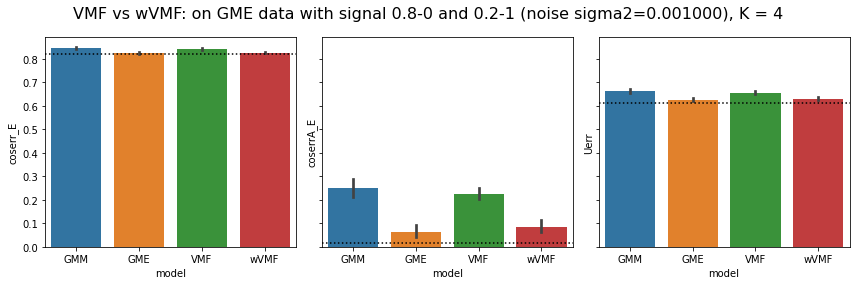

0.22624698063375162 0.08621878157000422 Ttest_relResult(statistic=6.959114979152935, pvalue=7.675164573315447e-09)
0.656284 0.630832 Ttest_relResult(statistic=5.470741206318398, pvalue=1.5125191469356766e-06)


In [14]:
from generativeMRF.notebooks.test_emissions import do_full_comparison_emission, plot_comparision_VMF_wVMF, getData_from_T

T = do_full_comparison_emission(clusters=K, iters=50, P=5000, beta=3.0, subjs=1,
                                    true_models=['GME'], disper=[0.001],
                                    same_signal=True, missingdata=None)
plot_comparision_VMF_wVMF(T, K=K, dispersion=0.001)
plt.show()

import scipy.stats as spst
D1 = getData_from_T(T, crit='coserrA_E', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D1[0].mean(), D1[1].mean(), spst.ttest_rel(D1[0], D1[1]))

D2 = getData_from_T(T, crit='Uerr', true_model='GME', fit_model=['VMF', 'wVMF'], trim_locmin=False)
print(D2[0].mean(), D2[1].mean(), spst.ttest_rel(D2[0], D2[1]))